#### 1. Install TensorFlow Object Detection API
- Please make sure you have installed tensorflow or tensorflow-gpu already. 
- For latest install instructions, check the [github](https://github.com/tensorflow/models/tree/master/research/object_detection) page or [readthedocs](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html) site for this API.

Clone git repo tensorflow/models - Copying the model code in the google colab machine - the GitHub Repository.


In [138]:
!git clone https://github.com/tensorflow/models

fatal: destination path 'models' already exists and is not an empty directory.


In [139]:
#Verify that models folder exist, the clone will make a models folder in our current directory
ls -l

total 674850
-rw------- 1 root root     34955 Jan 24 07:34  Calories_Datasheet.xlsx
-rw------- 1 root root  20137850 Jan 24 08:19  Capstone_TFOD_mobilenet.ipynb
-rw------- 1 root root      3076 Jan 24 08:57 'Copy of faster_rcnn_resnet101_coco.config'
-rw------- 1 root root      7234 Jan 23 09:23  export_inference_graph.py
drwx------ 3 root root      4096 Jan 22 08:08  faster_rcnn_resnet101_coco_2018_01_28/
-rw------- 1 root root 593445323 Feb 10  2018  faster_rcnn_resnet101_coco_2018_01_28.tar.gz
-rw------- 1 root root      3076 Jan 23 16:02  faster_rcnn_resnet101_coco.config
drwx------ 4 root root      4096 Jan 15 12:17  Food_Recognition/
-rw------- 1 root root    172007 Jan 22 07:57  Food_Recognition.csv
drwx------ 3 root root      4096 Jan 23 09:24  Food_Recognition_faster_rcnn_resnet101_model/
-rw------- 1 root root       268 Jan 22 08:07  Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 22 07:58  Food_Recognition_Refined.csv
-rw------- 1 root root      4440 J

In [2]:
#Multiple folders including object_detection should exist in models/research folder 
!ls -l models/research/

total 280
drwxr-xr-x  2 root root 4096 Jan 24 06:24 a3c_blogpost
drwxr-xr-x  2 root root 4096 Jan 24 06:24 adversarial_crypto
drwxr-xr-x  4 root root 4096 Jan 24 06:24 adversarial_logit_pairing
drwxr-xr-x  3 root root 4096 Jan 24 06:24 adversarial_text
drwxr-xr-x  2 root root 4096 Jan 24 06:24 adv_imagenet_models
drwxr-xr-x  2 root root 4096 Jan 24 06:24 astronet
drwxr-xr-x  3 root root 4096 Jan 24 06:24 attention_ocr
drwxr-xr-x  4 root root 4096 Jan 24 06:24 audioset
drwxr-xr-x  2 root root 4096 Jan 24 06:24 autoaugment
drwxr-xr-x  3 root root 4096 Jan 24 06:24 autoencoder
drwxr-xr-x  4 root root 4096 Jan 24 06:24 brain_coder
drwxr-xr-x 11 root root 4096 Jan 24 06:24 cognitive_mapping_and_planning
drwxr-xr-x  4 root root 4096 Jan 24 06:24 cognitive_planning
drwxr-xr-x  4 root root 4096 Jan 24 06:24 compression
drwxr-xr-x  7 root root 4096 Jan 24 06:24 cvt_text
drwxr-xr-x  3 root root 4096 Jan 24 06:24 deep_contextual_bandits
drwxr-xr-x  9 root root 4096 Jan 24 06:24 deeplab
drwxr-xr-x

Install other dependencies including protobuf compiler

In [3]:
!apt-get -qq install protobuf-compiler python-pil python-lxml python-tk
!pip install --user Cython  --quiet
!pip install --user contextlib2 --quiet
!pip install --user jupyter --quiet
!pip install --user matplotlib --quiet

Selecting previously unselected package python-bs4.
(Reading database ... 135004 files and directories currently installed.)
Preparing to unpack .../0-python-bs4_4.6.0-1_all.deb ...
Unpacking python-bs4 (4.6.0-1) ...
Selecting previously unselected package python-pkg-resources.
Preparing to unpack .../1-python-pkg-resources_39.0.1-2_all.deb ...
Unpacking python-pkg-resources (39.0.1-2) ...
Selecting previously unselected package python-chardet.
Preparing to unpack .../2-python-chardet_3.0.4-1_all.deb ...
Unpacking python-chardet (3.0.4-1) ...
Selecting previously unselected package python-six.
Preparing to unpack .../3-python-six_1.11.0-2_all.deb ...
Unpacking python-six (1.11.0-2) ...
Selecting previously unselected package python-webencodings.
Preparing to unpack .../4-python-webencodings_0.5-2_all.deb ...
Unpacking python-webencodings (0.5-2) ...
Selecting previously unselected package python-html5lib.
Preparing to unpack .../5-python-html5lib_0.999999999-1_all.deb ...
Unpacking pyt

Protobuf compilation
- Convert .pb files to python code in object detection folder

In [4]:
#Move to models/research folder
%cd models/research

#Convert all the protobuf files to Python code using Protobuf compiler installed in previous step
!protoc object_detection/protos/*.proto --python_out=.

/content/models/research


In [5]:
#So here we can see each .proto file has a corresponding .py file as well
!ls -l object_detection/protos

total 724
-rw-r--r-- 1 root root   6848 Jan 24 06:25 anchor_generator_pb2.py
-rw-r--r-- 1 root root    747 Jan 24 06:24 anchor_generator.proto
-rw-r--r-- 1 root root   4359 Jan 24 06:25 argmax_matcher_pb2.py
-rw-r--r-- 1 root root   1151 Jan 24 06:24 argmax_matcher.proto
-rw-r--r-- 1 root root   2175 Jan 24 06:25 bipartite_matcher_pb2.py
-rw-r--r-- 1 root root    350 Jan 24 06:24 bipartite_matcher.proto
-rw-r--r-- 1 root root   6208 Jan 24 06:25 box_coder_pb2.py
-rw-r--r-- 1 root root    656 Jan 24 06:24 box_coder.proto
-rw-r--r-- 1 root root  35788 Jan 24 06:25 box_predictor_pb2.py
-rw-r--r-- 1 root root   7366 Jan 24 06:24 box_predictor.proto
-rw-r--r-- 1 root root  24908 Jan 24 06:25 calibration_pb2.py
-rw-r--r-- 1 root root   2876 Jan 24 06:24 calibration.proto
-rw-r--r-- 1 root root  13553 Jan 24 06:25 eval_pb2.py
-rw-r--r-- 1 root root   3923 Jan 24 06:24 eval.proto
-rw-r--r-- 1 root root   3445 Jan 24 06:25 faster_rcnn_box_coder_pb2.py
-rw-r--r-- 1 root root    531 Jan 24 06:24 

Setup environment variable - Our machine needs to know where Object Detection Model

In [6]:
#Change path to models/research and models/research/slim folders based on where you have cloned github repository above - Path is given 
%set_env PYTHONPATH=$PYTHONPATH:/content/models/research:/content/models/research/slim

env: PYTHONPATH=$PYTHONPATH:/content/models/research:/content/models/research/slim


Test Installation

In [8]:
#To be run from models/research folder
!python object_detection/builders/model_builder_test.py

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Running tests under Python 3.6.9: /usr/bin/python3
[ RUN      ] ModelBuilderTest.test_create_experimental_model
[       OK ] ModelBuilderTest.test_create_experimental_model
[ RUN      ] ModelBuilderTest.test_create_faster_rcnn_model_from_config_with_example_miner
[       OK ] ModelBuilderTest.test_create_faster_rcnn_model_from_config_with_example_miner
[ RUN      ] ModelBuilderTest.test_create_faster_rcnn_models_from_config_faster_rcnn_with_matmul
[       OK ] ModelBuilderTest.test_create_faster_rcnn_models_from_config_faster_rcnn_with_matmul
[ RUN      ] ModelBuilderTest.test_create_faster_rcnn_models_from_config_faster_rcnn_wi

#### 2. Get the DataSet

Check the Directory of Capstone Prep

In [9]:
#Come to the home directory
%cd /content

from google.colab import drive
drive.mount('/content/drive')

/content
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [10]:
cd drive/My Drive/Capstone/Caps/Food_Recognition

/content/drive/My Drive/Capstone/Caps/Food_Recognition


In [0]:
!ls -l

total 8
drwx------ 2 root root 4096 Jan 18 09:21 Annotations
drwx------ 2 root root 4096 Jan 18 09:00 JPEGImages


In [0]:
#Number of images
!ls -l JPEGImages | wc -l

2140


Review image annotation in XML

In [0]:
#Number of XML files - it should one for each image
!ls -l Annotations | wc -l

2140


In [0]:
#Lets check an XML file
!cat Annotations/'Chapati (38).xml'

<annotation>
	<folder>birme 400 x 500</folder>
	<filename>Chapati (38).jpg</filename>
	<path>D:\1_GreatLakes\Caps\Capstone Images\More\Chapati\birme 400 x 500\Chapati (38).jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>400</width>
		<height>500</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>Chapati</name>
		<pose>Unspecified</pose>
		<truncated>1</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1</xmin>
			<ymin>107</ymin>
			<xmax>400</xmax>
			<ymax>420</ymax>
		</bndbox>
	</object>
</annotation>


#### 3. Data Pre-processing : Convert XML to CSV

Use xml_to_csv.py file provided. This script will read all XML files and save the information in a CSV file.
 Here we are copying the script file from Google Drive.

In [11]:
pwd

'/content/drive/My Drive/Capstone/Caps/Food_Recognition'

In [12]:
cd ..

/content/drive/My Drive/Capstone/Caps


In [0]:
#We should have 'xml_to_csv.py' script in our current folder
!ls -l

total 655132
-rw------- 1 root root      3076 Jan 22 09:25 'Copy of faster_rcnn_resnet101_coco.config'
drwx------ 2 root root      4096 Jan 22 08:08  faster_rcnn_resnet101_coco_2018_01_28
-rw------- 1 root root 593445323 Feb 10  2018  faster_rcnn_resnet101_coco_2018_01_28.tar.gz
-rw------- 1 root root      3076 Jan 20 08:31  faster_rcnn_resnet101_coco.config
drwx------ 4 root root      4096 Jan 15 12:17  Food_Recognition
-rw------- 1 root root    172007 Jan 22 07:57  Food_Recognition.csv
-rw------- 1 root root       268 Jan 22 08:07  Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 22 07:58  Food_Recognition_Refined.csv
-rw------- 1 root root      4440 Jan 15 12:34  generate_tfrecord.py
-rw------- 1 root root      4541 Jan 22 08:09  model_main.py
-rw------- 1 root root     31926 Jan 22 07:59  test.csv
-rw------- 1 root root  15774486 Jan 22 08:05  test.record
-rw------- 1 root root    128533 Jan 22 07:59  train.csv
drwx------ 2 root root      4096 Jan 22 08:09  tr

Generate CSV file from all XML files using copied script. The script requires two parameters
1. -i <xml_files_folder_name> : indicating XML files are stored
2. -o <output_file_path> : indicating what name should be given to CSV output file and where it should be stored.

In [0]:
#Running the script with options
!python xml_to_csv.py -i Food_Recognition/Annotations -o Food_Recognition.csv

Successfully converted xml to csv.


In [0]:
#We should have Food_Recognition.csv file (Details of all images, just created via xml_to_csv.py script above) in current folder
!ls -l

total 183
-rw------- 1 root root   3076 Jan 20 08:31 faster_rcnn_resnet101_coco.config
drwx------ 4 root root   4096 Jan 15 12:17 Food_Recognition
-rw------- 1 root root 172007 Jan 22 07:57 Food_Recognition.csv
-rw------- 1 root root   4440 Jan 15 12:34 generate_tfrecord.py
-rw------- 1 root root   2583 Jan 15 12:34 xml_to_csv.py


Load csv file as dataframe
The csv created has details of each object (and not image) and it's location x1,y1 and x2,y2

In [0]:
import pandas as pd
df = pd.read_csv('Food_Recognition.csv')
df.head(5)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,Green_Salad_(31).jpg,400,500,Green_Salad,2,2,400,493
1,Green_Salad_(300).jpg,400,500,Green_Salad,4,31,400,492
2,Green_Salad_(30).jpg,400,500,Green_Salad,3,6,396,142
3,Green_Salad_(30).jpg,400,500,Green_Salad,180,148,398,499
4,Green_Salad_(36).jpg,400,500,Green_Salad,4,33,395,370


In [0]:
#How many object across all images - So currently we have 4186 Objects
df.shape

(3445, 8)

In [0]:
## Segregating the classes
df["class"]= df["class"].replace("Boiled_Egg", "egg") 
df["class"]= df["class"].replace("Boilled Egg", "egg")
df["class"]= df["class"].replace("Roti", "Chapati")
df["class"]= df["class"].replace("Biryani", "veg_biryani")
df["class"]= df["class"].replace("Butter Panner", "Butter Paneer") 
df["class"]= df["class"].replace("Matar_Paneer", "Butter Paneer")
df["class"]= df["class"].replace("Salad", "Green_Salad")

In [0]:
df.head(2)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,Green_Salad_(31).jpg,400,500,Green_Salad,2,2,400,493
1,Green_Salad_(300).jpg,400,500,Green_Salad,4,31,400,492


In [0]:
condition = (df['class'] == "egg") | (df['class'] =="Hot_beverages") | (df['class'] =="Chapati") | (df['class'] =="Green_Salad") | (df['class'] =="Noodles") | (df['class'] =="veg_biryani")|(df['class'] =="Butter Paneer")

In [0]:
df1 =  df[condition]
df1.head(5)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,Green_Salad_(31).jpg,400,500,Green_Salad,2,2,400,493
1,Green_Salad_(300).jpg,400,500,Green_Salad,4,31,400,492
2,Green_Salad_(30).jpg,400,500,Green_Salad,3,6,396,142
3,Green_Salad_(30).jpg,400,500,Green_Salad,180,148,398,499
4,Green_Salad_(36).jpg,400,500,Green_Salad,4,33,395,370


In [0]:
 df1.shape

(3062, 8)

In [0]:
#List of labels
df1['class'].unique()

array(['Green_Salad', 'Chapati', 'Butter Paneer', 'veg_biryani',
       'Hot_beverages', 'Noodles', 'egg'], dtype=object)

In [0]:
#Number of labels/classes, So here we have labelled 71 Objects
len(df1['class'].unique())

7

In [0]:
df1['class'].value_counts()

egg              870
Hot_beverages    438
Chapati          398
Green_Salad      395
Noodles          329
veg_biryani      322
Butter Paneer    310
Name: class, dtype: int64

We will need to Label encode classes e.g assign a unique index number for each class

In [0]:
#Use Label encoder available in Scikit Learn
from sklearn import preprocessing

In [0]:
#Label Encode class and add a 'label' column to the dataframe
le = preprocessing.LabelEncoder()
df1['label'] = le.fit_transform(df1['class'])
df1.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,filename,width,height,class,xmin,ymin,xmax,ymax,label
0,Green_Salad_(31).jpg,400,500,Green_Salad,2,2,400,493,2
1,Green_Salad_(300).jpg,400,500,Green_Salad,4,31,400,492,2
2,Green_Salad_(30).jpg,400,500,Green_Salad,3,6,396,142,2
3,Green_Salad_(30).jpg,400,500,Green_Salad,180,148,398,499,2
4,Green_Salad_(36).jpg,400,500,Green_Salad,4,33,395,370,2


In [0]:
#unique values in the label
df1.label.unique()

array([2, 1, 0, 6, 3, 4, 5])

In [0]:
#Object detection API expects index to start from 1 (and not 0)
df1['label'] = df1['label'] + 1
df1.label.unique()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


array([3, 2, 1, 7, 4, 5, 6])

In [0]:
#Dataframe should have label column now
df1.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,label
0,Green_Salad_(31).jpg,400,500,Green_Salad,2,2,400,493,3
1,Green_Salad_(300).jpg,400,500,Green_Salad,4,31,400,492,3
2,Green_Salad_(30).jpg,400,500,Green_Salad,3,6,396,142,3
3,Green_Salad_(30).jpg,400,500,Green_Salad,180,148,398,499,3
4,Green_Salad_(36).jpg,400,500,Green_Salad,4,33,395,370,3


In [0]:
#Create a dictionary of Label and Class. This will be useful for building our second input to Model training
label_class_dict = dict(zip(df1['label'], df1['class']))
label_class_dict

{1: 'Butter Paneer',
 2: 'Chapati',
 3: 'Green_Salad',
 4: 'Hot_beverages',
 5: 'Noodles',
 6: 'egg',
 7: 'veg_biryani'}

In [0]:
df1.to_csv('Food_Recognition_Refined.csv') 

In [0]:
#So our Final Dataset with Boundary Box Details of only the Objects we are present with is saved in the file as "Food_Recognition_Refined.xlsx"
ls-l

total 354
-rw------- 1 root root   3076 Jan 20 08:31 faster_rcnn_resnet101_coco.config
drwx------ 4 root root   4096 Jan 15 12:17 Food_Recognition/
-rw------- 1 root root 172007 Jan 22 07:57 Food_Recognition.csv
-rw------- 1 root root 174797 Jan 22 07:58 Food_Recognition_Refined.csv
-rw------- 1 root root   4440 Jan 15 12:34 generate_tfrecord.py
-rw------- 1 root root   2583 Jan 15 12:34 xml_to_csv.py


**Split data between training and test**

First we have to split images between training and test. Then we can use that information to split dataframe between training and test. This will make sure objects from same image are not split between training and test.

In [0]:
#Get information on all images - All the image names under one array 
all_classes = df1['filename'].unique()
all_classes.shape

(2069,)

In [0]:
#Split images between training and test
import numpy as np

#80% of the data will be used for training
mask = np.random.rand(all_classes.shape[0]) < 0.8

#Get Training and Test images
train_images = all_classes[mask]
test_images = all_classes[~mask] 

In [0]:
#Check number of images in training and test
train_images.shape, test_images.shape

((1651,), (418,))

In [0]:
#Split dataframe between training and test
train_df = df1[df1['filename'].isin(train_images)]
test_df = df1[df1['filename'].isin(test_images)]

In [0]:
train_df.shape, test_df.shape

((2452, 9), (610, 9))

**Visualizing the data**

In [0]:
#We will use opencv and matplotlib
from matplotlib import pyplot as plt
import cv2

In [0]:
#Pickup a random image number
img_num = np.random.randint(0, df1.shape[0])

#Read the image
img_file = df1.loc[img_num,'filename']
img = cv2.imread('Food_Recognition/JPEGImages/' + img_file)

#Find all rows which have same file name
rows_with_file = df1[df1['filename'] == img_file].index.tolist()

#Draw rectangle(s) as per bounding box information
for i in rows_with_file:

    #Get bounding box
    xmin, ymin, xmax, ymax = df1.loc[i, ['xmin', 'ymin', 'xmax', 'ymax']]
    #Get Label
    label = df1.loc[i, 'class']
    #Add bounding box
    cv2.rectangle(img, (xmin,ymin), (xmax, ymax), (0,255,0), 2)
    #Add text
    cv2.putText(img,label,(xmin, ymin-5),cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.figure(figsize=(15,10))
plt.imshow(img)
plt.show()

NameError: ignored

Save training and test data as csv

In [0]:
train_df.to_csv('train.csv', index=False)
test_df.to_csv('test.csv', index=False)

In [0]:
#We should have train.csv and test.csv files in current directory
!ls -l

total 655132
-rw------- 1 root root      3076 Jan 22 09:25 'Copy of faster_rcnn_resnet101_coco.config'
drwx------ 2 root root      4096 Jan 22 08:08  faster_rcnn_resnet101_coco_2018_01_28
-rw------- 1 root root 593445323 Feb 10  2018  faster_rcnn_resnet101_coco_2018_01_28.tar.gz
-rw------- 1 root root      3076 Jan 20 08:31  faster_rcnn_resnet101_coco.config
drwx------ 4 root root      4096 Jan 15 12:17  Food_Recognition
-rw------- 1 root root    172007 Jan 22 07:57  Food_Recognition.csv
-rw------- 1 root root       268 Jan 22 08:07  Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 22 07:58  Food_Recognition_Refined.csv
-rw------- 1 root root      4440 Jan 15 12:34  generate_tfrecord.py
-rw------- 1 root root      4541 Jan 22 08:09  model_main.py
-rw------- 1 root root     31926 Jan 22 07:59  test.csv
-rw------- 1 root root  15774486 Jan 22 08:05  test.record
-rw------- 1 root root    128533 Jan 22 07:59  train.csv
drwx------ 2 root root      4096 Jan 22 08:09  tr

#### 4. Generate tfrecord from CSV
Tensorflow object detection API requires data in tfrecord format. This can be done using generate_tfrecord.py file.

In [0]:
#Make sure the script file is available in working folder
!ls -l

total 280
drwxr-xr-x  2 root root 4096 Jan 22 17:45 a3c_blogpost
drwxr-xr-x  2 root root 4096 Jan 22 17:45 adversarial_crypto
drwxr-xr-x  4 root root 4096 Jan 22 17:45 adversarial_logit_pairing
drwxr-xr-x  3 root root 4096 Jan 22 17:45 adversarial_text
drwxr-xr-x  2 root root 4096 Jan 22 17:45 adv_imagenet_models
drwxr-xr-x  2 root root 4096 Jan 22 17:45 astronet
drwxr-xr-x  3 root root 4096 Jan 22 17:45 attention_ocr
drwxr-xr-x  4 root root 4096 Jan 22 17:45 audioset
drwxr-xr-x  2 root root 4096 Jan 22 17:45 autoaugment
drwxr-xr-x  3 root root 4096 Jan 22 17:45 autoencoder
drwxr-xr-x  4 root root 4096 Jan 22 17:45 brain_coder
drwxr-xr-x 11 root root 4096 Jan 22 17:45 cognitive_mapping_and_planning
drwxr-xr-x  4 root root 4096 Jan 22 17:45 cognitive_planning
drwxr-xr-x  4 root root 4096 Jan 22 17:45 compression
drwxr-xr-x  7 root root 4096 Jan 22 17:45 cvt_text
drwxr-xr-x  3 root root 4096 Jan 22 17:45 deep_contextual_bandits
drwxr-xr-x  9 root root 4096 Jan 22 17:45 deeplab
drwxr-xr-x

In [0]:
#Make sure models/research folder is on system path
#Please change folder name is you are using a different folder structure
import sys
sys.path.append('/content/models/research')

The script file requires 3 inputs

1. --csv_input=<csv_file_path> : where is csv file located which was prepared in previous step
2. --img_path=<images_folder> : where are the actual images stored
3. --output_path=<output_file_path> : where the script can save the generated tfrecord file and what should be file name.

We will run script for training and test csv separately to create two tfrecord files.

In [0]:
#generate tfrecord for training data
!python generate_tfrecord.py --csv_input=train.csv  --img_path=Food_Recognition/JPEGImages --output_path=train.record

Successfully created the TFRecords: /content/drive/My Drive/Capstone/Caps/train.record


In [0]:
#generate tfrecord for test data
!python generate_tfrecord.py --csv_input=test.csv  --img_path=Food_Recognition/JPEGImages --output_path=test.record

Successfully created the TFRecords: /content/drive/My Drive/Capstone/Caps/test.record


In [0]:
dfdhfdgf

In [0]:
#train.record and test.record files should be available now
!ls -l

total 75579
-rw------- 1 root root     3076 Jan 20 08:31 faster_rcnn_resnet101_coco.config
drwx------ 4 root root     4096 Jan 15 12:17 Food_Recognition
-rw------- 1 root root   172007 Jan 22 07:57 Food_Recognition.csv
-rw------- 1 root root   174797 Jan 22 07:58 Food_Recognition_Refined.csv
-rw------- 1 root root     4440 Jan 15 12:34 generate_tfrecord.py
-rw------- 1 root root    31926 Jan 22 07:59 test.csv
-rw------- 1 root root 15774486 Jan 22 08:07 test.record
-rw------- 1 root root   128533 Jan 22 07:59 train.csv
-rw------- 1 root root 61093970 Jan 22 08:05 train.record
-rw------- 1 root root     2583 Jan 15 12:34 xml_to_csv.py


#### 5. Create Label File

In [0]:
#Dict which was created earlier will be used for building Label Mapping file
label_class_dict

{1: 'Butter Paneer',
 2: 'Chapati',
 3: 'Green_Salad',
 4: 'Hot_beverages',
 5: 'Noodles',
 6: 'egg',
 7: 'veg_biryani'}

In [0]:
#Build a pbtxt label file using label and class name
#This is required by Object detection API
#You can prepare it manually as well. 
#A sample pbtxt file can be found at object_detection/data/pascal_label_map.pbtxt
pbtxt_file_txt = ''
for label in sorted(label_class_dict.keys()):
    
    pbtxt_file_txt += "item {\n  id: " + str(label) + "\n  name: '" +  label_class_dict[label] + "'\n}\n\n"

with open('Food_Recognition_Label_File.pbtxt','w') as pbfile:
    pbfile.write(pbtxt_file_txt)

In [0]:
!ls -l

total 75576
-rw------- 1 root root        0 Jan 18 18:26 faster_rcnn_resnet50_coco.config
drwx------ 4 root root     4096 Jan 15 12:17 Food_Recognition
-rw------- 1 root root   172007 Jan 19 04:46 Food_Recognition.csv
-rw------- 1 root root      268 Jan 19 05:06 Food_Recognition_Label_File.pbtxt
-rw------- 1 root root   174797 Jan 19 04:56 Food_Recognition_Refined.csv
-rw------- 1 root root     4440 Jan 15 12:34 generate_tfrecord.py
-rw------- 1 root root    33775 Jan 19 04:57 test.csv
-rw------- 1 root root 14543154 Jan 19 05:06 test.record
-rw------- 1 root root   126684 Jan 19 04:57 train.csv
-rw------- 1 root root 62325302 Jan 19 05:03 train.record
-rw------- 1 root root     2583 Jan 15 12:34 xml_to_csv.py


In [0]:
#Review the file content
!cat Food_Recognition_Label_File.pbtxt

item {
  id: 1
  name: 'Butter Paneer'
}

item {
  id: 2
  name: 'Chapati'
}

item {
  id: 3
  name: 'Green_Salad'
}

item {
  id: 4
  name: 'Hot_beverages'
}

item {
  id: 5
  name: 'Noodles'
}

item {
  id: 6
  name: 'egg'
}

item {
  id: 7
  name: 'veg_biryani'
}



#### 6. Download a pre-trained model

A list of pre-trained models is available at [TensorFlow model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md#coco-trained-models-coco-models). We will use 'ssd_mobilenet_v1_coco' model for transfer learning.

In [0]:
#Download the model from zoo
!wget -q http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet101_coco_2018_01_28.tar.gz

In [0]:
!ls -l

total 447994
-rw------- 1 root root 381355771 Feb 10  2018 faster_rcnn_resnet50_coco_2018_01_28.tar.gz
-rw------- 1 root root         0 Jan 18 18:26 faster_rcnn_resnet50_coco.config
drwx------ 4 root root      4096 Jan 15 12:17 Food_Recognition
-rw------- 1 root root    172007 Jan 19 04:46 Food_Recognition.csv
-rw------- 1 root root       268 Jan 19 05:06 Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 19 04:56 Food_Recognition_Refined.csv
-rw------- 1 root root      4440 Jan 15 12:34 generate_tfrecord.py
-rw------- 1 root root     33775 Jan 19 04:57 test.csv
-rw------- 1 root root  14543154 Jan 19 05:06 test.record
-rw------- 1 root root    126684 Jan 19 04:57 train.csv
-rw------- 1 root root  62325302 Jan 19 05:03 train.record
-rw------- 1 root root      2583 Jan 15 12:34 xml_to_csv.py


In [0]:
#Extract tar file content
!tar -xvf faster_rcnn_resnet101_coco_2018_01_28.tar.gz

faster_rcnn_resnet101_coco_2018_01_28/
faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.index
faster_rcnn_resnet101_coco_2018_01_28/checkpoint
faster_rcnn_resnet101_coco_2018_01_28/pipeline.config
faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.meta
faster_rcnn_resnet101_coco_2018_01_28/saved_model/
faster_rcnn_resnet101_coco_2018_01_28/saved_model/saved_model.pb
faster_rcnn_resnet101_coco_2018_01_28/saved_model/variables/
faster_rcnn_resnet101_coco_2018_01_28/frozen_inference_graph.pb


In [0]:
!ls -l

total 655116
drwx------ 3 root root      4096 Feb  1  2018 faster_rcnn_resnet101_coco_2018_01_28
-rw------- 1 root root 593445323 Feb 10  2018 faster_rcnn_resnet101_coco_2018_01_28.tar.gz
drwx------ 4 root root      4096 Jan 15 12:17 Food_Recognition
-rw------- 1 root root    172007 Jan 20 07:48 Food_Recognition.csv
-rw------- 1 root root       268 Jan 20 08:09 Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 20 07:53 Food_Recognition_Refined.csv
-rw------- 1 root root      4440 Jan 15 12:34 generate_tfrecord.py
-rw------- 1 root root     30603 Jan 20 07:54 test.csv
-rw------- 1 root root  13908863 Jan 20 08:08 test.record
-rw------- 1 root root    129856 Jan 20 07:54 train.csv
-rw------- 1 root root  62959593 Jan 20 08:02 train.record
-rw------- 1 root root      2583 Jan 15 12:34 xml_to_csv.py


In [0]:
!ls -l faster_rcnn_resnet101_coco_2018_01_28
#model.ckpt.data-00000-of-00001 --> This model is the model prepared and given for Transfer Learning.

total 445467
-rw------- 1 root root        77 Feb  1  2018 checkpoint
-rw------- 1 root root 196487618 Feb  1  2018 frozen_inference_graph.pb
-rw------- 1 root root 253091636 Feb  1  2018 model.ckpt.data-00000-of-00001
-rw------- 1 root root     25718 Feb  1  2018 model.ckpt.index
-rw------- 1 root root   6543572 Feb  1  2018 model.ckpt.meta
-rw------- 1 root root      3221 Feb  1  2018 pipeline.config
drwx------ 3 root root      4096 Feb  1  2018 saved_model


#### 7. Prepare Training configuration file

You can copy a sample configuration for the chosen pre-trained model (ssd_mobilenet_v1_coco) in this case from 'object_detection/samples/configs' folder. Here are things which need to be changed at a minimum.

1. Change num_classes parameter to 32 (as we have 32 categories in our dataset)
2. For 'train_input_reader' change 'input_path' to filepath of train.record file.
3. For 'train_input_reader' change 'label_map_path' to filepath of Food_Recognition_Label_File.pbtxt file.
4. Repeat above two steps for 'eval_input_reader'.
5. Change fine_tune_checkpoint to filepath where pre-trained model.ckpt file is available e.g ssd_mobilenet_v1_coco_2018_01_28/model.ckpt
6. Change 'batch_size' accordingly to available memory.
7. Change 'num_steps' to indicate how long the training will done e.g. 200000. For demo purpose, we are keeping it to 20 so that we can finish training quickly.


In [0]:
ls -l

total 655132
-rw------- 1 root root      3076 Jan 22 09:25 'Copy of faster_rcnn_resnet101_coco.config'
drwx------ 2 root root      4096 Jan 22 08:08  faster_rcnn_resnet101_coco_2018_01_28/
-rw------- 1 root root 593445323 Feb 10  2018  faster_rcnn_resnet101_coco_2018_01_28.tar.gz
-rw------- 1 root root      3076 Jan 20 08:31  faster_rcnn_resnet101_coco.config
drwx------ 4 root root      4096 Jan 15 12:17  Food_Recognition/
-rw------- 1 root root    172007 Jan 22 07:57  Food_Recognition.csv
-rw------- 1 root root       268 Jan 22 08:07  Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 22 07:58  Food_Recognition_Refined.csv
-rw------- 1 root root      4440 Jan 15 12:34  generate_tfrecord.py
-rw------- 1 root root      4541 Jan 22 08:09  model_main.py
-rw------- 1 root root     31926 Jan 22 07:59  test.csv
-rw------- 1 root root  15774486 Jan 22 08:05  test.record
-rw------- 1 root root    128533 Jan 22 07:59  train.csv
drwx------ 2 root root      4096 Jan 22 08:09  

In [0]:
!cat  faster_rcnn_resnet101_coco.config

model {
  faster_rcnn {
    num_classes: 7
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 600
        max_dimension: 1024
      }
    }
    feature_extractor {
      type: "faster_rcnn_resnet101"
      first_stage_features_stride: 16
    }
    first_stage_anchor_generator {
      grid_anchor_generator {
        height_stride: 16
        width_stride: 16
        scales: 0.25
        scales: 0.5
        scales: 1.0
        scales: 2.0
        aspect_ratios: 0.5
        aspect_ratios: 1.0
        aspect_ratios: 2.0
      }
    }
    first_stage_box_predictor_conv_hyperparams {
      op: CONV
      regularizer {
        l2_regularizer {
          weight: 0.0
        }
      }
      initializer {
        truncated_normal_initializer {
          stddev: 0.00999999977648
        }
      }
    }
    first_stage_nms_score_threshold: 0.0
    first_stage_nms_iou_threshold: 0.699999988079
    first_stage_max_proposals: 100
    first_stage_localization_loss_weight: 2.0

#### 8. Training the model

In [0]:
#Copy train.py file from 'models/research/object_detection/legacy' folder to current folder -- Copying the executable model file in our current directory
#!cp /content/models/research/object_detection/legacy/train.py .
!cp /content/models/research/object_detection/model_main.py .

In [0]:
!ls -l
#train.py file exists

total 655125
drwx------ 3 root root      4096 Feb  1  2018 faster_rcnn_resnet101_coco_2018_01_28
-rw------- 1 root root 593445323 Feb 10  2018 faster_rcnn_resnet101_coco_2018_01_28.tar.gz
-rw------- 1 root root      3076 Jan 20 08:31 faster_rcnn_resnet101_coco.config
drwx------ 4 root root      4096 Jan 15 12:17 Food_Recognition
-rw------- 1 root root    172007 Jan 22 07:57 Food_Recognition.csv
-rw------- 1 root root       268 Jan 22 08:07 Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 22 07:58 Food_Recognition_Refined.csv
-rw------- 1 root root      4440 Jan 15 12:34 generate_tfrecord.py
-rw------- 1 root root      4541 Jan 22 08:09 model_main.py
-rw------- 1 root root     31926 Jan 22 07:59 test.csv
-rw------- 1 root root  15774486 Jan 22 08:07 test.record
-rw------- 1 root root    128533 Jan 22 07:59 train.csv
-rw------- 1 root root  61093970 Jan 22 08:05 train.record
-rw------- 1 root root      2583 Jan 15 12:34 xml_to_csv.py


Start training 

- Please note that Object detection take long time to train. The training may take few days if run on single GPU machine (depending on num of steps indicated). Try to keep training the model till loss comes close to 1 (or goes below 1). The script takes 3 inputs

1. --train=<folder_name> : where model will be saved periodically as training progresses
2. --pipeline_config_path=<config_file_path> :where is model training configuration file located.
3. --logtostderr : Where error and warning messages will be sent. Not providing any value means that it will show messages on the screen.

In [0]:
#Create a training folder to store model checkpoints/snapshots as training progresses
!mkdir training

In [0]:
!ls -l

total 12
drwx------ 4 root root 4096 Jan 22 06:31 drive
drwxr-xr-x 7 root root 4096 Jan 22 06:29 models
drwxr-xr-x 1 root root 4096 Jan 13 16:38 sample_data


In [0]:
#start training
#!python train.py --train_dir=training/ --pipeline_config_path=faster_rcnn_resnet101_coco.config --logtostderr

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.






Instructions for updating:
Use object_detection/model_main.py.
W0120 08:31:55.950949 139918665172864 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/absl/app.py:250: main (from __main__) is deprecated and will be removed in a future version.
Instructions for updating:
Use object_detection/model_main.py.

W0120 08:31:55.951227 139918665172864 module_wrapper.py:139] From train.py:91: The name tf.gfile.MakeDirs is deprecated. Please use tf.io.gfile.makedirs instead.


W0120 08:31:55.951839 139918665172864 module_wrapper.py:139] From /content/models/research/object_detection/utils/config_util.py:102: The name tf

In [0]:
#!python train.py --train_dir=training/ --pipeline_config_path=faster_rcnn_resnet101_coco.config --logtostderr
!python model_main.py --pipeline_config_path=faster_rcnn_resnet101_coco.config --model_dir=training/ --alsologtostderr

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



W0123 08:09:51.365670 140638583441280 module_wrapper.py:139] From /content/models/research/object_detection/utils/config_util.py:102: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.


W0123 08:09:51.699111 140638583441280 module_wrapper.py:139] From /content/models/research/object_detection/model_lib.py:628: The name tf.logging.warning is deprecated. Please use tf.compat.v1.logging.warning instead.

W0123 08:09:51.699357 140638583441280 model_lib.py:629] Forced number of epochs for all eval validations to be 1.

W0123 08:09:51.699496 140638583441280 module_wrapper.py:139] From /content/models/resea

In [0]:
ls -l

total 4
drwxr-xr-x 1 root root 4096 Jan 13 16:38 sample_data/


In [0]:
#TensorBoard Code
from tensorflow.keras.callbacks import TensorBoard

In [0]:
tensorboard = TensorBoard(log_dir = "training/ ")

Using TensorFlow backend.


Wait for 8 seconds...
TensorBoard link:
https://ebf6e747.ngrok.io


In [109]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

# Load the TensorBoard notebook extension
%load_ext tensorboard

TensorFlow is already loaded. Please restart the runtime to change versions.


In [119]:
%tensorboard --logdir training/

Output hidden; open in https://colab.research.google.com to view.

In [0]:
pwd

'/content/drive/My Drive/Capstone/Caps'

In [0]:
!tensorboard --logdir = training

usage: tensorboard [-h] [--helpfull] [--logdir PATH] [--host ADDR]
                   [--port PORT] [--purge_orphaned_data BOOL] [--db URI]
                   [--db_import] [--inspect] [--version_tb] [--tag TAG]
                   [--event_file PATH] [--path_prefix PATH]
                   [--window_title TEXT] [--max_reload_threads COUNT]
                   [--reload_interval SECONDS] [--reload_task TYPE]
                   [--reload_multifile BOOL]
                   [--reload_multifile_inactive_secs SECONDS]
                   [--generic_data TYPE]
                   [--samples_per_plugin SAMPLES_PER_PLUGIN]
                   [--debugger_data_server_grpc_port PORT]
                   [--debugger_port PORT] [--master_tpu_unsecure_channel ADDR]
tensorboard: error: unrecognized arguments: training


In [0]:
#Check the training folder --Saving is also done here
!ls -l training

#All the model.ckpt files are saved.
# Here only two models are saved at iteration # 0 and 200 - First and Last iteration models are saved
# Saving happens at every 500 iterations
#It keeps the last 5 of these models only, so as not to increase a lot size. 

total 2277332
-rw------- 1 root root       261 Jan 23 08:15 checkpoint
drwx------ 2 root root      4096 Jan 23 08:49 eval_0
-rw------- 1 root root  27823264 Jan 22 08:10 events.out.tfevents.1579680642.db3ee38e575b
-rw------- 1 root root  27822850 Jan 22 17:52 events.out.tfevents.1579715553.138d00d0d5a9
-rw------- 1 root root  27822638 Jan 23 08:15 events.out.tfevents.1579767026.1c957862af1a
drwx------ 3 root root      4096 Jan 23 08:49 export
-rw------- 1 root root  14608963 Jan 23 08:10 graph.pbtxt
-rw------- 1 root root 439010152 Jan 23 08:15 model.ckpt-100.data-00000-of-00001
-rw------- 1 root root     40511 Jan 23 08:15 model.ckpt-100.index
-rw------- 1 root root   7728343 Jan 23 08:15 model.ckpt-100.meta
-rw------- 1 root root 439010152 Jan 22 19:12 model.ckpt-82.data-00000-of-00001
-rw------- 1 root root     40511 Jan 22 19:12 model.ckpt-82.index
-rw------- 1 root root   7728331 Jan 22 19:12 model.ckpt-82.meta
-rw------- 1 root root 439010152 Jan 22 19:47 model.ckpt-83.data-00000

#### 9. Export trained model

From the saved model checkpoints, we will create a frozen trained model. Frozen here means to remove model nodes which are no longer needed in prediction. This reduces model size.

In [0]:
#Copy export_inference_graph.py file from models/research/object_detection to current directory
!cp /content/models/research/object_detection/export_inference_graph.py .

In [0]:
# "export_inference_graph.py" file should be present in pwd
!ls -l

total 655140
-rw------- 1 root root      3076 Jan 22 09:25 'Copy of faster_rcnn_resnet101_coco.config'
-rw------- 1 root root      7234 Jan 23 09:23  export_inference_graph.py
drwx------ 3 root root      4096 Jan 22 08:08  faster_rcnn_resnet101_coco_2018_01_28
-rw------- 1 root root 593445323 Feb 10  2018  faster_rcnn_resnet101_coco_2018_01_28.tar.gz
-rw------- 1 root root      3076 Jan 20 08:31  faster_rcnn_resnet101_coco.config
drwx------ 4 root root      4096 Jan 15 12:17  Food_Recognition
-rw------- 1 root root    172007 Jan 22 07:57  Food_Recognition.csv
-rw------- 1 root root       268 Jan 22 08:07  Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 22 07:58  Food_Recognition_Refined.csv
-rw------- 1 root root      4440 Jan 15 12:34  generate_tfrecord.py
-rw------- 1 root root      4541 Jan 22 08:09  model_main.py
-rw------- 1 root root     31926 Jan 22 07:59  test.csv
-rw------- 1 root root  15774486 Jan 22 08:05  test.record
-rw------- 1 root root    128533 

The export_inference_graph.py script file requires the following input:

1. --input_type <input_node_name> : This will be used during prediction to set model input
2. --pipeline_config_path <model_training_config_file_path> : where is model training config file located.
3. --trained_checkpoint_prefix <file_path__model_checkpoint> : Which checkpoint should be used to create final model.
4. --output_directory <frozen_model_directory> : where should the frozen model created by script should be stored.

In [0]:
#Provide input name, config file location, training folder
!python export_inference_graph.py --input_type image_tensor --pipeline_config_path faster_rcnn_resnet101_coco.config --trained_checkpoint_prefix training/model.ckpt-100 --output_directory Food_Recognition_faster_rcnn_resnet101_model

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



W0123 09:24:29.349340 139734029526912 module_wrapper.py:139] From export_inference_graph.py:145: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.


W0123 09:24:29.358189 139734029526912 module_wrapper.py:139] From /content/models/research/object_detection/exporter.py:402: The name tf.gfile.MakeDirs is deprecated. Please use tf.io.gfile.makedirs instead.


W0123 09:24:29.360464 139734029526912 module_wrapper.py:139] From /content/models/research/object_detection/exporter.py:121: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.


W0123 09:24:29.410233 139734029526912

In [0]:
#Check if model is saved in current direcoty
!ls -l Food_Recognition_faster_rcnn_resnet101_model

total 432846
-rw------- 1 root root        77 Jan 23 09:24 checkpoint
-rw------- 1 root root 190708951 Jan 23 09:24 frozen_inference_graph.pb
-rw------- 1 root root 249690296 Jan 23 09:24 model.ckpt.data-00000-of-00001
-rw------- 1 root root     25713 Jan 23 09:24 model.ckpt.index
-rw------- 1 root root   2799851 Jan 23 09:24 model.ckpt.meta
-rw------- 1 root root      3044 Jan 23 09:24 pipeline.config
drwx------ 3 root root      4096 Jan 23 09:24 saved_model


In [0]:
!ls -l

total 655144
-rw------- 1 root root      3076 Jan 22 09:25 'Copy of faster_rcnn_resnet101_coco.config'
-rw------- 1 root root      7234 Jan 23 09:23  export_inference_graph.py
drwx------ 3 root root      4096 Jan 22 08:08  faster_rcnn_resnet101_coco_2018_01_28
-rw------- 1 root root 593445323 Feb 10  2018  faster_rcnn_resnet101_coco_2018_01_28.tar.gz
-rw------- 1 root root      3076 Jan 20 08:31  faster_rcnn_resnet101_coco.config
drwx------ 4 root root      4096 Jan 15 12:17  Food_Recognition
-rw------- 1 root root    172007 Jan 22 07:57  Food_Recognition.csv
drwx------ 3 root root      4096 Jan 23 09:24  Food_Recognition_faster_rcnn_resnet101_model
-rw------- 1 root root       268 Jan 22 08:07  Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 22 07:58  Food_Recognition_Refined.csv
-rw------- 1 root root      4440 Jan 15 12:34  generate_tfrecord.py
-rw------- 1 root root      4541 Jan 22 08:09  model_main.py
-rw------- 1 root root     31926 Jan 22 07:59  test.csv


So here our model of 94 mb has been reduced to 23 mb.    
frozen_inference_graph.pb model is the frozen moel, which can be used for prediction.


We can use '**frozen_inference_graph.pb**' model for model prediction.
frozen_inference_graph

In [0]:
import tensorflow as tf
import os
import urllib, tarfile

In [0]:
ls -l

total 655144
-rw------- 1 root root      3076 Jan 22 09:25 'Copy of faster_rcnn_resnet101_coco.config'
-rw------- 1 root root      7234 Jan 23 09:23  export_inference_graph.py
drwx------ 3 root root      4096 Jan 22 08:08  faster_rcnn_resnet101_coco_2018_01_28/
-rw------- 1 root root 593445323 Feb 10  2018  faster_rcnn_resnet101_coco_2018_01_28.tar.gz
-rw------- 1 root root      3076 Jan 20 08:31  faster_rcnn_resnet101_coco.config
drwx------ 4 root root      4096 Jan 15 12:17  Food_Recognition/
-rw------- 1 root root    172007 Jan 22 07:57  Food_Recognition.csv
drwx------ 3 root root      4096 Jan 23 09:24  Food_Recognition_faster_rcnn_resnet101_model/
-rw------- 1 root root       268 Jan 22 08:07  Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 22 07:58  Food_Recognition_Refined.csv
-rw------- 1 root root      4440 Jan 15 12:34  generate_tfrecord.py
-rw------- 1 root root      4541 Jan 22 08:09  model_main.py
-rw------- 1 root root     31926 Jan 22 07:59  test.c

Load Model

In [10]:
#Come to the home directory
%cd /content

from google.colab import drive
drive.mount('/content/drive')

/content
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [11]:
cd /content/drive/My Drive/Capstone/Caps

/content/drive/My Drive/Capstone/Caps


In [0]:
pwd

'/content/drive/My Drive/Capstone/Caps'

In [0]:
#Set the variable to file path where your .pb is stored
PATH_TO_FROZEN_GRAPH = 'faster_rcnn_resnet101_coco_2018_01_28/frozen_inference_graph.pb'

In [0]:
#Load pb file
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_FROZEN_GRAPH, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

#### Load Labels

In [0]:
#Make sure models/research folder is on system path
#Please change folder name is you are using a diffrent folder structure
import sys
sys.path.append('/content/models/research')

In [15]:
#Change path to models/research and models/research/slim folders based on where you have cloned github repository above - Path is given 
%set_env PYTHONPATH=$PYTHONPATH:/content/models/research:/content/models/research/slim

env: PYTHONPATH=$PYTHONPATH:/content/models/research:/content/models/research/slim


In [0]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [17]:
#Change the filepath for .pbtxt mapping file depending on where you have stored your .pbtxt file
category_index = label_map_util.create_category_index_from_labelmap('./Food_Recognition_Label_File.pbtxt', use_display_name=True)
print(category_index)

{1: {'id': 1, 'name': 'Butter Paneer'}, 2: {'id': 2, 'name': 'Chapati'}, 3: {'id': 3, 'name': 'Green_Salad'}, 4: {'id': 4, 'name': 'Hot_beverages'}, 5: {'id': 5, 'name': 'Noodles'}, 6: {'id': 6, 'name': 'egg'}, 7: {'id': 7, 'name': 'veg_biryani'}}


Load Test Dataframe

In [0]:
ls -l 

total 655142
-rw------- 1 root root      7234 Jan 20 09:05 export_inference_graph.py
drwx------ 3 root root      4096 Jan 20 08:10 faster_rcnn_resnet101_coco_2018_01_28/
-rw------- 1 root root 593445323 Feb 10  2018 faster_rcnn_resnet101_coco_2018_01_28.tar.gz
-rw------- 1 root root      3076 Jan 20 08:31 faster_rcnn_resnet101_coco.config
drwx------ 4 root root      4096 Jan 15 12:17 Food_Recognition/
-rw------- 1 root root    172007 Jan 20 07:48 Food_Recognition.csv
drwx------ 3 root root      4096 Jan 20 09:06 Food_Recognition_faster_rcnn_resnet101_model/
-rw------- 1 root root       268 Jan 20 08:09 Food_Recognition_Label_File.pbtxt
-rw------- 1 root root    174797 Jan 20 07:53 Food_Recognition_Refined.csv
-rw------- 1 root root      4440 Jan 15 12:34 generate_tfrecord.py
-rw------- 1 root root     30603 Jan 20 07:54 test.csv
-rw------- 1 root root  13908863 Jan 20 08:08 test.record
-rw------- 1 root root    129856 Jan 20 07:54 train.csv
drwx------ 2 root root      4096 Jan 20 09:04

Model Prediction

In [0]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Function to do model prediction

In [0]:
def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[1], image.shape[2])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: image})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.int64)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict

In [0]:
def visualize_output(image_path):

  image = tf.keras.preprocessing.image.load_img(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = tf.keras.preprocessing.image.img_to_array(image).astype(np.uint8)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np_expanded, detection_graph)
  print(output_dict['detection_classes'])
  # Visualization of the results of a detection.
  im_width, im_height = image.size
  final_box = []
  #start: return a list containing bbox coordinate and class name
  # This is the way I'm getting my coordinates
  boxes = output_dict['detection_boxes']
  # get all boxes from an array
  max_boxes_to_draw = boxes.shape[0]
  # get scores to get a threshold
  scores = output_dict['detection_scores']
  # this is set as a default but feel free to adjust it to your needs
  min_score_thresh=.8
  # iterate over all objects found
  for i in range(min(max_boxes_to_draw, boxes.shape[0])):
    if scores is None or scores[i] > min_score_thresh:
        # boxes[i] is the box which will be drawn
        class_name = category_index[output_dict['detection_classes'][i]]['name']        
        ymin, xmin, ymax, xmax = boxes[i]
        final_box.append([xmin * im_width, xmax * im_width, ymin * im_height, ymax * im_height, class_name])
  print(final_box)      
  #end 

  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=8)
  plt.figure(figsize=(12,8))
  plt.imshow(image_np)
  plt.axis('on')
  plt.show()
  return final_box  

[59 67 59  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1]
[[15.102152526378632, 400.0, 7.894307374954224, 448.8985240459442, 'veg_biryani']]


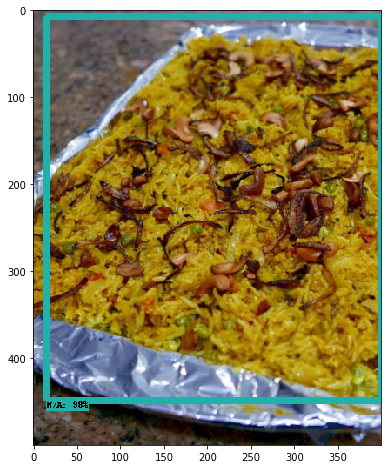

In [288]:
output11 = visualize_output('Food_Recognition/JPEGImages/vegbiryani (829).jpg')

[51 55 67  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1]
[[13.528819382190704, 347.9485750198364, 0.0, 438.94678354263306, 'egg']]


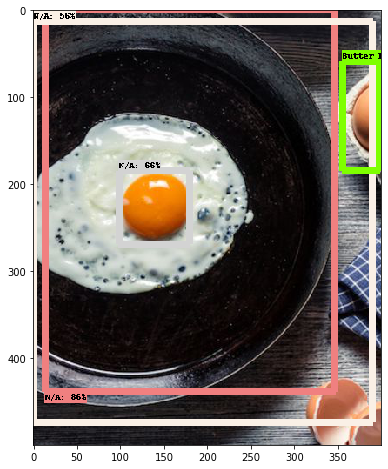

In [291]:
output12 = visualize_output('Food_Recognition/JPEGImages/Boiled_Egg (97).jpg')

[59 84 67 51 54 51 67 51  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1]
[[24.394796788692474, 311.4783763885498, 171.0030436515808, 300.4358410835266, 'Butter Paneer'], [183.6294174194336, 381.63225650787354, 371.8191981315613, 499.08605217933655, 'Butter Paneer'], [7.225993275642395, 400.0, 144.6520984172821, 492.898553609848, 'Butter Paneer']]


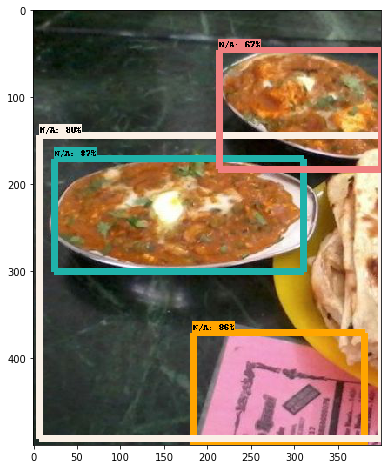

In [293]:
output13 = visualize_output('Food_Recognition/JPEGImages/bp (35).jpg')

In [0]:
print(outputdict_detecton_boxes)

[[57.22424387931824, 400.0, 0.0, 160.4406088590622, 'Butter Paneer'], [137.61944770812988, 391.39015674591064, 114.79760706424713, 468.12665462493896, 'Butter Paneer'], [10.130777955055237, 400.0, 0.0, 487.4672293663025, 'Butter Paneer'], [72.7496862411499, 346.0120439529419, 118.54186654090881, 335.05502343177795, 'Butter Paneer'], [178.95320653915405, 400.0, 195.8824098110199, 488.6871576309204, 'Butter Paneer']]


[57 51 67 57 48 57 57 57  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1]
[[165.59664011001587, 354.2311191558838, 223.20601344108582, 377.1786689758301, 'Noodles']]


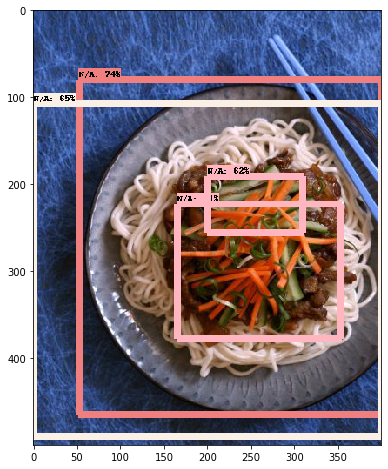

In [295]:
output14 = visualize_output('Food_Recognition/JPEGImages/nd (73).jpg')

[47 47 50 50 67 50 51 67  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1]
[[290.7214164733887, 400.0, 0.0, 175.34615099430084, 'Hot_beverages'], [45.399609208106995, 353.2973289489746, 18.29879730939865, 348.8805592060089, 'Hot_beverages'], [4.642445966601372, 262.465500831604, 307.2475790977478, 408.6802005767822, 'Hot_beverages']]


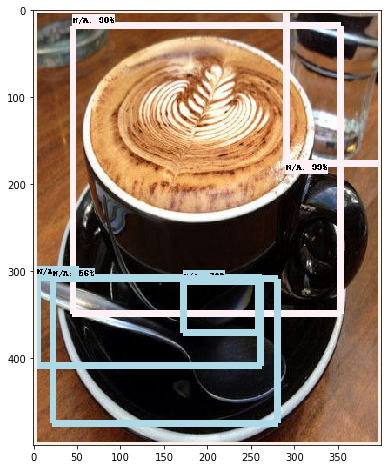

In [297]:
output15 = visualize_output('Food_Recognition/JPEGImages/hotbeverages (488).jpg')

[51 57 51 57 57 53 67  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1]
[[0.0, 400.0, 81.60040527582169, 475.55655241012573, 'Green_Salad']]


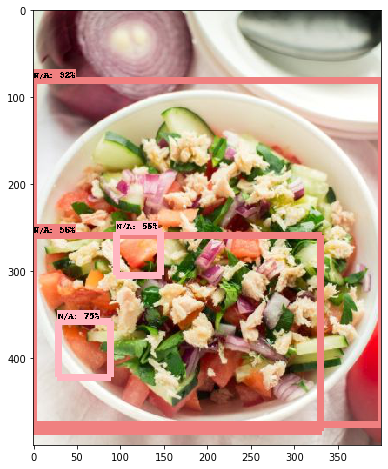

In [299]:
output16 = visualize_output('Food_Recognition/JPEGImages/Green_Salad_(151).jpg')

[61 59 67  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1]
[[25.195741653442383, 392.3556327819824, 32.99086540937424, 411.282479763031, 'Chapati']]


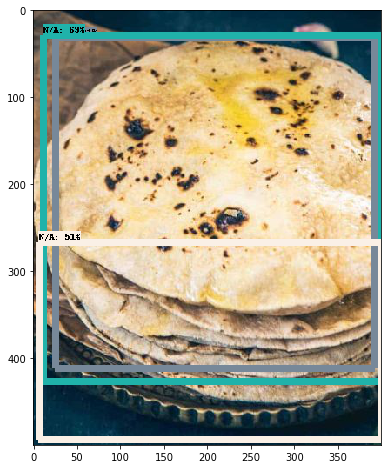

In [302]:
output17 = visualize_output('Food_Recognition/JPEGImages/Chapati (141).jpg')

Applying linear regression to get the calorie of each class

In [0]:
final_df =[]

In [0]:
final_df=output11+output12+output13+output14+output15+output16+output17

In [0]:
 import pandas as pd 

In [0]:
result_df_new = pd.DataFrame(final_df, columns = ["xmin", "xmax", "ymin", "ymax", "class"])

In [270]:
#training data
result_df_new

,xmin,xmax,ymin,ymax,class
0,15.102153,400.000000,7.894307,448.898524,Butter Paneer
1,13.528819,347.948575,0.000000,438.946784,Chapati
2,24.394797,311.478376,171.003044,300.435841,Green_Salad
5,165.596640,354.231119,223.206013,377.178669,Hot_beverages
6,290.721416,400.000000,0.000000,175.346151,Noodles
9,0.000000,400.000000,81.600405,475.556552,egg
10,0.000000,400.000000,81.600405,475.556552,veg_biryani


In [0]:
result_df_new.to_csv('Object_detection_Test.csv')

In [0]:
#calorie prediction
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
%matplotlib inline

In [2]:
#Come to the home directory
%cd /content

from google.colab import drive
drive.mount('/content/drive')

/content
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
cd drive/My Drive/Capstone/Caps/Food_Recognition

/content/drive/My Drive/Capstone/Caps/Food_Recognition


In [4]:
cd ..

/content/drive/My Drive/Capstone/Caps


In [0]:
#train_df prepration
file = 'Calories_Datasheet.xlsx'
df = pd.read_excel(file)

In [154]:
df.head()

,xmin,xmax,ymin,ymax,Class,Calories
0,224,371,65,92,egg,742
1,108,110,193,43,egg,79
2,153,400,221,445,egg,967
3,322,310,281,231,egg,226
4,95,318,482,417,egg,724


In [155]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700 entries, 0 to 699
Data columns (total 6 columns):
xmin        700 non-null int64
xmax        700 non-null int64
ymin        700 non-null int64
ymax        700 non-null int64
Class       700 non-null object
Calories    700 non-null int64
dtypes: int64(5), object(1)
memory usage: 32.9+ KB


In [0]:
df['Class'] = str(df['Class'])

In [134]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700 entries, 0 to 699
Data columns (total 6 columns):
xmin        700 non-null int64
xmax        700 non-null int64
ymin        700 non-null int64
ymax        700 non-null int64
Class       700 non-null object
Calories    700 non-null int64
dtypes: int64(5), object(1)
memory usage: 32.9+ KB


In [158]:
df = pd.get_dummies(data=df, columns=['Class'], drop_first=True)
df.head()

,xmin,xmax,ymin,ymax,Calories,Class_Chapati,Class_Green_Salad,Class_Hot_beverages,Class_Noodles,Class_egg,Class_veg_biryani
0,224,371,65,92,742,0,0,0,0,1,0
1,108,110,193,43,79,0,0,0,0,1,0
2,153,400,221,445,967,0,0,0,0,1,0
3,322,310,281,231,226,0,0,0,0,1,0
4,95,318,482,417,724,0,0,0,0,1,0


In [0]:
df =  df.fillna(0)

In [160]:
df.head()

,xmin,xmax,ymin,ymax,Calories,Class_Chapati,Class_Green_Salad,Class_Hot_beverages,Class_Noodles,Class_egg,Class_veg_biryani
0,224,371,65,92,742,0,0,0,0,1,0
1,108,110,193,43,79,0,0,0,0,1,0
2,153,400,221,445,967,0,0,0,0,1,0
3,322,310,281,231,226,0,0,0,0,1,0
4,95,318,482,417,724,0,0,0,0,1,0


In [0]:
X = df.drop("Calories", axis=1)
y = df["Calories"]

In [0]:
#from sklearn.model_selection import train_test_split

In [0]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

In [0]:
from sklearn.linear_model import LinearRegression

In [0]:
linreg = LinearRegression()

In [164]:
linreg.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [0]:
#linreg.predict(X_test)

Prediction of calories

In [272]:
result_df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7 entries, 0 to 10
Data columns (total 5 columns):
xmin     7 non-null float64
xmax     7 non-null float64
ymin     7 non-null float64
ymax     7 non-null float64
class    7 non-null object
dtypes: float64(4), object(1)
memory usage: 336.0+ bytes


In [273]:
result_df_new = pd.get_dummies(result_df_new, drop_first=True)
result_df_new.head()

,xmin,xmax,ymin,ymax,class_Chapati,class_Green_Salad,class_Hot_beverages,class_Noodles,class_egg,class_veg_biryani
0,15.102153,400.000000,7.894307,448.898524,0,0,0,0,0,0
1,13.528819,347.948575,0.000000,438.946784,1,0,0,0,0,0
2,24.394797,311.478376,171.003044,300.435841,0,1,0,0,0,0
5,165.596640,354.231119,223.206013,377.178669,0,0,1,0,0,0
6,290.721416,400.000000,0.000000,175.346151,0,0,0,1,0,0


In [0]:
result_df_new =  result_df_new.fillna(0)

In [274]:
result_df_new.head()

,xmin,xmax,ymin,ymax,class_Chapati,class_Green_Salad,class_Hot_beverages,class_Noodles,class_egg,class_veg_biryani
0,15.102153,400.000000,7.894307,448.898524,0,0,0,0,0,0
1,13.528819,347.948575,0.000000,438.946784,1,0,0,0,0,0
2,24.394797,311.478376,171.003044,300.435841,0,1,0,0,0,0
5,165.596640,354.231119,223.206013,377.178669,0,0,1,0,0,0
6,290.721416,400.000000,0.000000,175.346151,0,0,0,1,0,0


In [275]:
linreg.predict(result_df_new)

array([484.10846278, 507.08898285, 512.21912493, 475.5075996 ,
       535.75934774, 504.75662632, 470.17297794])

In [0]:
predicted_calories = linreg.predict(result_df_new)

In [0]:
final_test_df = pd.read_csv('Object_detection_Test.csv')

In [0]:
del final_test_df['Unnamed: 0']

In [0]:
calories=predicted_calories 

In [0]:
final_test_df['Calories']=calories

In [285]:
final_test_df

,xmin,xmax,ymin,ymax,class,Calories
0,15.102153,400.000000,7.894307,448.898524,Butter Paneer,484.108463
1,13.528819,347.948575,0.000000,438.946784,Chapati,507.088983
2,24.394797,311.478376,171.003044,300.435841,Green_Salad,512.219125
3,165.596640,354.231119,223.206013,377.178669,Hot_beverages,475.507600
4,290.721416,400.000000,0.000000,175.346151,Noodles,535.759348
5,0.000000,400.000000,81.600405,475.556552,egg,504.756626
6,0.000000,400.000000,81.600405,475.556552,veg_biryani,470.172978


In [0]:
final_test_df.to_csv('Output_class_and_calories_With.csv', index=False)